<a href="https://colab.research.google.com/github/bimaadiwijaya8/PCVK26_05_BimaAdiwijaya/blob/main/P3_TugasD1_05_ipnyb.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

*Link Github: *

Akses folder images pada Google Drive Anda dengan kode berikut:

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Melakukan transformasi linier brightness dengan memasukkan nilai konstanta tertentu
dan menghasilkan warna.

 Mengubah tingkat kecerahan citra 
--------------------------------
Masukkan nilai kecerahan: 30


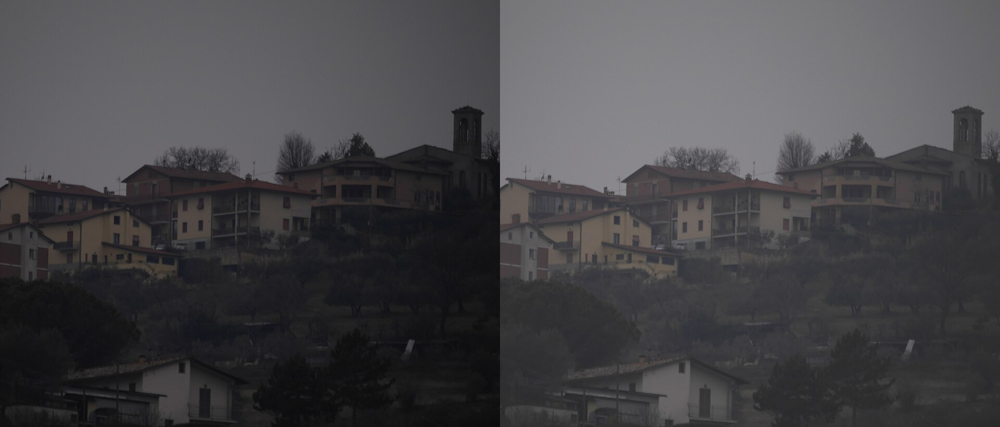

In [5]:
import cv2 as cv
import numpy as np

print(' Mengubah tingkat kecerahan citra ')
print('--------------------------------')
try:
    brightness = int(input('Masukkan nilai kecerahan: '))
except ValueError:
    print('Error, not a number')

#sesuaikan dengan file dan folder di drive Anda
original = cv.imread('/content/drive/MyDrive/PCVK/Gambar/houses.jpg')
brightness_image = np.zeros(original.shape, original.dtype)

#akses per piksel
#np.clip digunakan untuk melakukan truncate pixel (nilai dibatasi antara 0-255)
for y in range(original.shape[0]):
    for x in range(original.shape[1]):
        for c in range(original.shape[2]):
            brightness_image[y,x,c] = np.clip(original[y,x,c] + brightness, 0, 255)

#cara simple tanpa for loop
#brightness_image = cv.convertScaleAbs(original, beta=brightness)

final_frame = cv.hconcat((original, brightness_image))
cv2_imshow(final_frame)

#Tugas Praktikum

1. Implementasikan inverse citra pada Google Colaboratory menggunakan formula yang
terdapat pada bagian Ulasan Teori, sehingga menghasilkan keluaran seperti berikut:

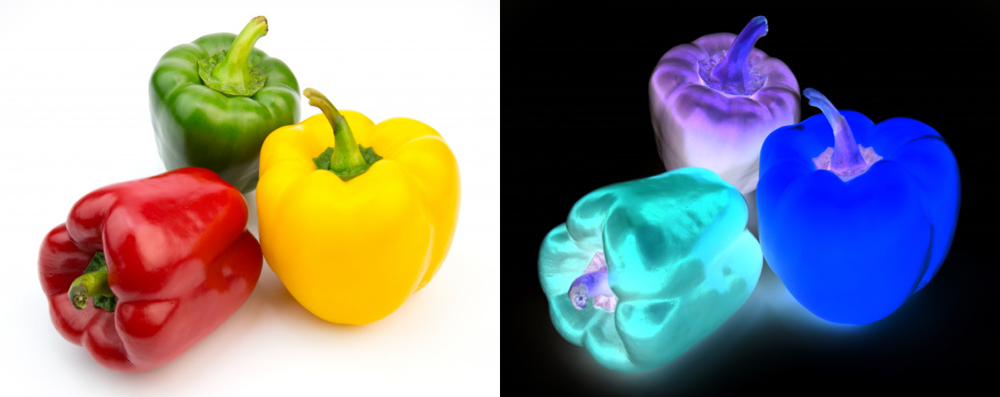

In [4]:
import cv2 as cv
import numpy as np
from google.colab.patches import cv2_imshow

# Baca gambar (sesuaikan path gambar peppers Anda)
img = cv.imread('/content/drive/MyDrive/PCVK/Gambar/peppers.jpg')

if img is None:
    print("Error: Gambar tidak ditemukan!")
else:
    # Menggunakan rumus 255 - pixel
    # np.clip digunakan agar nilai pixel tetap di rentang 0-255
    inversed_image = np.clip(255 - img, 0, 255).astype(np.uint8)

    # Gabungkan gambar asli dan gambar hasil inverse secara horizontal
    final_frame = cv.hconcat((img, inversed_image))

    # Tampilkan hasil
    cv2_imshow(final_frame)

2. Implementasikan transformasi contrast pada Google Colaboratory menggunakan
formula yang terdapat pada bagian Ulasan Teori untuk kontras, sehingga
menghasilkan keluaran seperti berikut:

Mengubah kontras dan tingkat kecerahan citra
-------------------------------------------
Masukkan tingkat kecerahan : 10
Masukkan kontras : 1.5


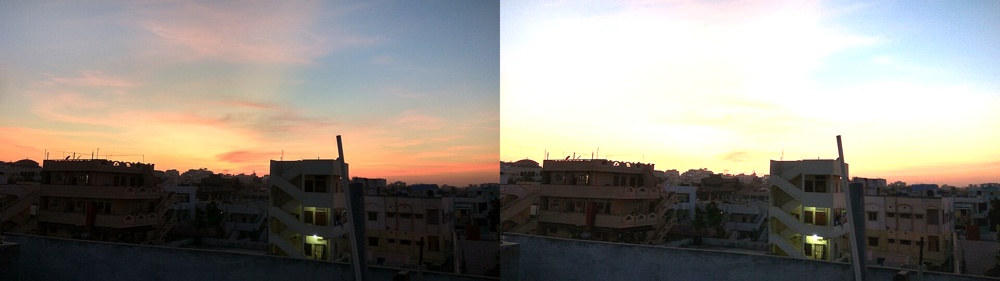

In [6]:
import cv2 as cv
import numpy as np
from google.colab.patches import cv2_imshow

print('Mengubah kontras dan tingkat kecerahan citra')
print('-------------------------------------------')

try:
    brightness = float(input('Masukkan tingkat kecerahan : ')) # β (beta)
    contrast = float(input('Masukkan kontras : '))            # α (alpha)

    # Baca gambar (sesuaikan path gambar lanskap/bangunan Anda)
    img = cv.imread('/content/drive/MyDrive/PCVK/Gambar/sunset.jpg')

    if img is None:
        print("Error: Gambar tidak ditemukan!")
    else:
        # Menyiapkan matriks kosong dengan bentuk & tipe yang sama
        contrast_image = np.zeros(img.shape, img.dtype)

        # Mengubah kontras dan kecerahan per piksel
        # contrast * img + brightness
        contrast_image = np.clip(contrast * img + brightness, 0, 255).astype(np.uint8)

        # Gabungkan gambar asli dan gambar hasil perubahan secara horizontal
        final_frame = cv.hconcat((img, contrast_image))

        # Tampilkan hasil
        cv2_imshow(final_frame)

except ValueError:
    print('Error: Masukkan angka yang valid!')

3. Implementasikan transformasi logarithmic brightness pada Google Colaboratory
menggunakan formula yang terdapat pada bagian Ulasan Teori untuk transformasi
log, sehingga menghasilkan keluaran seperti berikut:

Mengubah tingkat kecerahan citra dengan Transformasi Log
------------------------------------------------------
Masukkan nilai kecerahan: 50


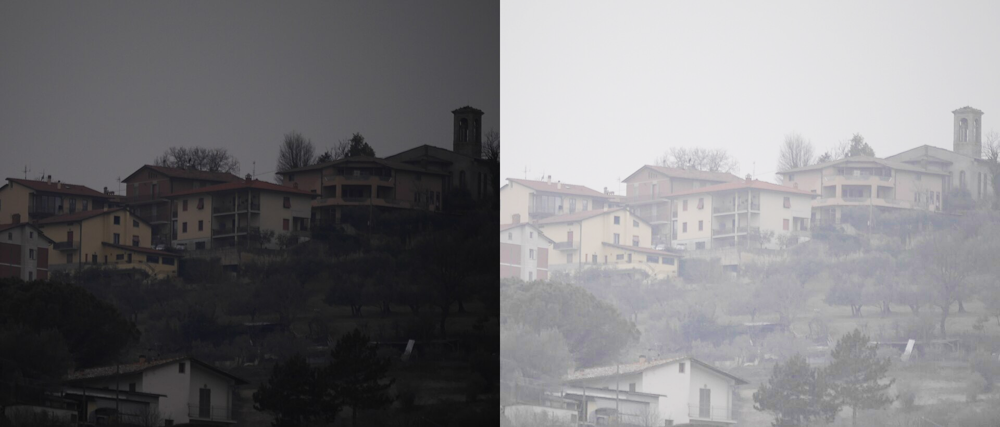

In [7]:
import cv2 as cv
import numpy as np
from google.colab.patches import cv2_imshow

print('Mengubah tingkat kecerahan citra dengan Transformasi Log')
print('------------------------------------------------------')

try:
    c = float(input('Masukkan nilai kecerahan: '))

    # Baca gambar (sesuaikan path gambar Anda)
    img = cv.imread('/content/drive/MyDrive/PCVK/Gambar/houses.jpg')

    if img is None:
        print("Error: Gambar tidak ditemukan!")
    else:
        # Konversi tipe data gambar ke float agar perhitungan log tidak overflow
        img_float = img.astype(np.float32)

        # Menerapkan rumus transformasi log: s = c * log(1 + r)
        # np.log1p(x) sama dengan np.log(1 + x)
        log_image = c * np.log1p(img_float)

        # Batasi nilai piksel antara 0–255 dan ubah kembali ke uint8
        log_image = np.clip(log_image, 0, 255).astype(np.uint8)

        # Gabungkan gambar asli dan hasil transformasi log secara horizontal
        final_frame = cv.hconcat((img, log_image))

        # Tampilkan hasil
        cv2_imshow(final_frame)

except ValueError:
    print('Error: Masukkan angka yang valid!')

4. Implementasikan transformasi grayscale menggunakan metode averaging, lightness,
dan luminance pada Google Colaboratory menggunakan formula yang terdapat pada
bagian Ulasan Teori, sehingga menghasilkan keluaran seperti berikut:

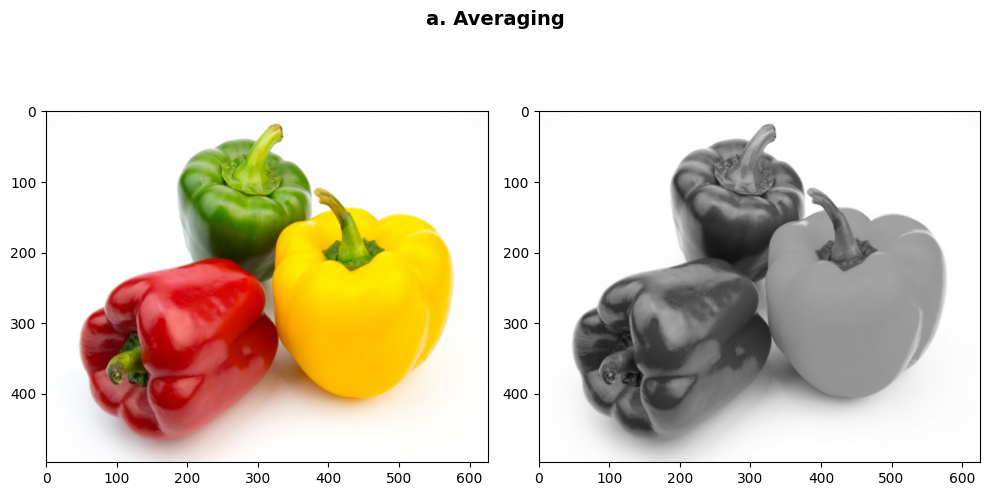

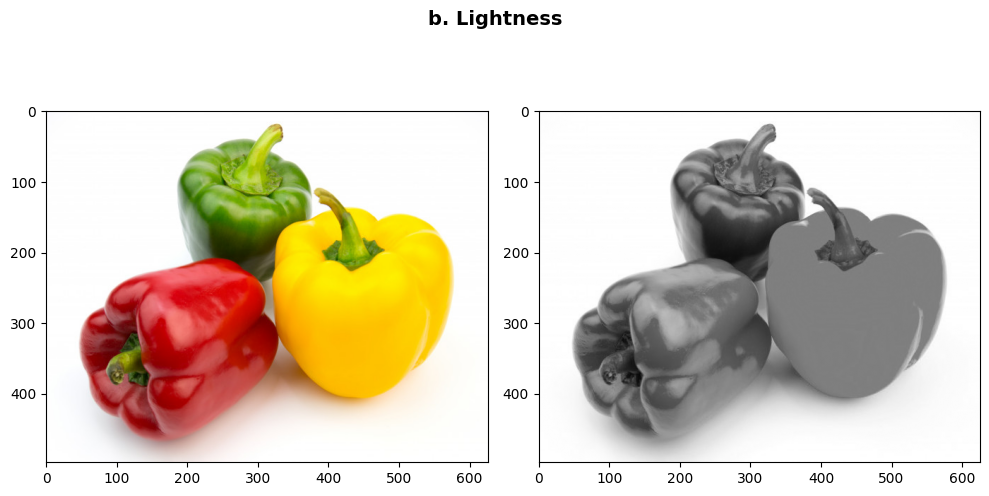

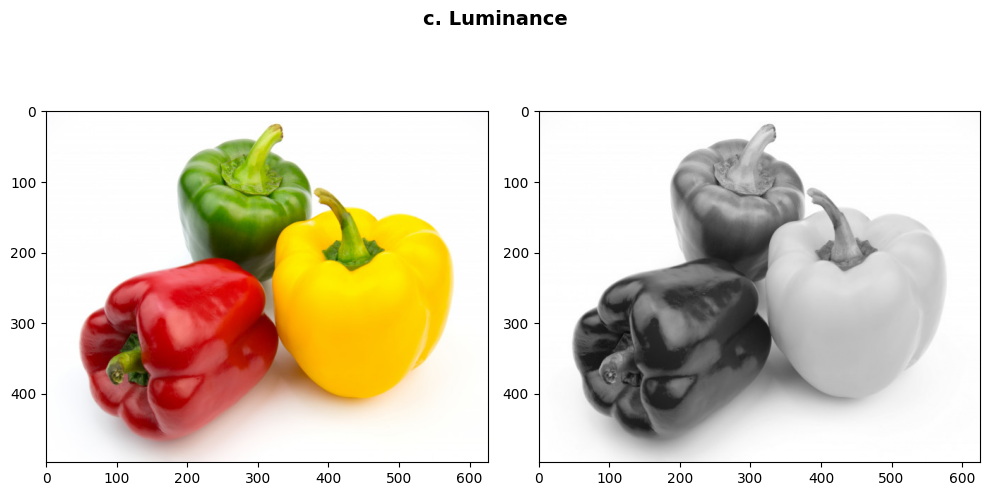

In [9]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# 1. Baca gambar (OpenCV membaca dalam format BGR)
img = cv.imread('/content/drive/MyDrive/PCVK/Gambar/peppers.jpg')

if img is None:
    print("Error: Gambar tidak ditemukan!")
else:
    # Ubah BGR ke RGB untuk tampilan matplotlib
    img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)

    # Ambil channel R, G, dan B terpisah (tipe float32 agar tidak overflow)
    R = img_rgb[:, :, 0].astype(np.float32)
    G = img_rgb[:, :, 1].astype(np.float32)
    B = img_rgb[:, :, 2].astype(np.float32)

    # --- a. Averaging ---
    gray_avg = (R + G + B) / 3.0

    # --- b. Lightness ---
    max_val = np.maximum(np.maximum(R, G), B)
    min_val = np.minimum(np.minimum(R, G), B)
    gray_lightness = (max_val + min_val) / 2.0

    # --- c. Luminance ---
    gray_luminance = 0.21 * R + 0.72 * G + 0.07 * B

    # Fungsi untuk menampilkan gambar asli & hasil grayscale dengan matplotlib
    def show_comparison(original, gray_img, title):
        plt.figure(figsize=(10, 5))

        # Subplot 1: Gambar Asli (RGB)
        plt.subplot(1, 2, 1)
        plt.imshow(original)

        # Subplot 2: Gambar Grayscale
        plt.subplot(1, 2, 2)
        plt.imshow(gray_img.astype(np.uint8), cmap='gray', vmin=0, vmax=255)

        plt.suptitle(title, fontsize=14, fontweight='bold', y=1.02)
        plt.tight_layout()
        plt.show()

    # Tampilkan ketiga metode sesuai instruksi tugas
    show_comparison(img_rgb, gray_avg, 'a. Averaging')
    show_comparison(img_rgb, gray_lightness, 'b. Lightness')
    show_comparison(img_rgb, gray_luminance, 'c. Luminance')

5. Tampilkanlah warna tertentu pada citra, dan ubah warna lain menjadi grayscale. Misal,
tampilkan warna merah pada citra masukan dan ubah bagian lain yang tidak berwarna
merah menjadi grayscale seperti pada contoh berikut:

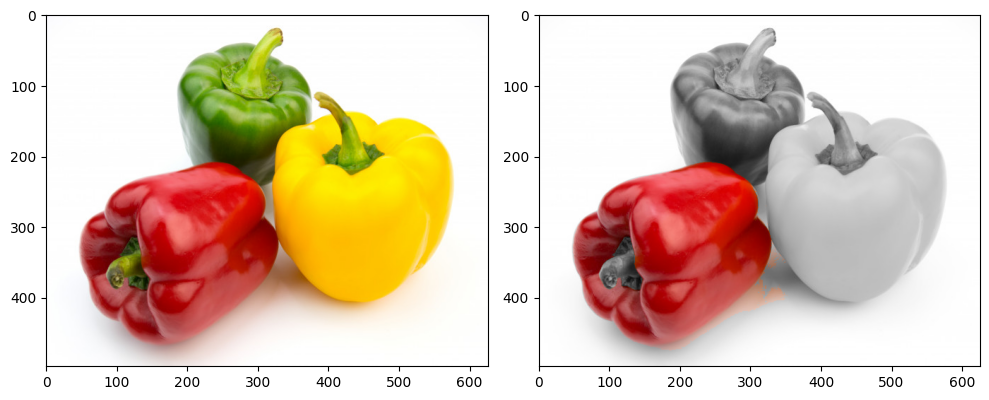

In [10]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# 1. Baca gambar dari Google Drive
img = cv.imread('/content/drive/MyDrive/PCVK/Gambar/peppers.jpg')

if img is None:
    print("Error: Gambar tidak ditemukan! Cek path file Anda.")
else:
    # Ubah BGR ke RGB untuk tampilan dengan matplotlib
    img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)

    # Konversi ke HSV untuk isolasi warna merah
    hsv = cv.cvtColor(img, cv.COLOR_BGR2HSV)

    # Rentang warna merah di ruang HSV
    lower_red1 = np.array([0, 50, 50])
    upper_red1 = np.array([10, 255, 255])
    lower_red2 = np.array([170, 50, 50])
    upper_red2 = np.array([180, 255, 255])

    # Masking warna merah
    mask1 = cv.inRange(hsv, lower_red1, upper_red1)
    mask2 = cv.inRange(hsv, lower_red2, upper_red2)
    mask_red = mask1 | mask2

    # Buat versi grayscale (3 channel RGB agar kompatibel saat digabung)
    gray = cv.cvtColor(img_rgb, cv.COLOR_RGB2GRAY)
    gray_3ch = cv.cvtColor(gray, cv.COLOR_GRAY2RGB)

    # Hanya pertahankan warna merah dari img_rgb, bagian lain diambil dari gray_3ch
    result = np.where(mask_red[:, :, np.newaxis] == 255, img_rgb, gray_3ch)

    # Tampilkan menggunakan matplotlib (dengan sumbu koordinat)
    plt.figure(figsize=(10, 5))

    plt.subplot(1, 2, 1)
    plt.imshow(img_rgb)

    plt.subplot(1, 2, 2)
    plt.imshow(result)

    plt.tight_layout()
    plt.show()

6. Buat Gamma Correction sesuai dengan petunjuk berikut

 Gamma Correction pada citra 
---------------------------------
Masukkan nilai Gamma: 0.5


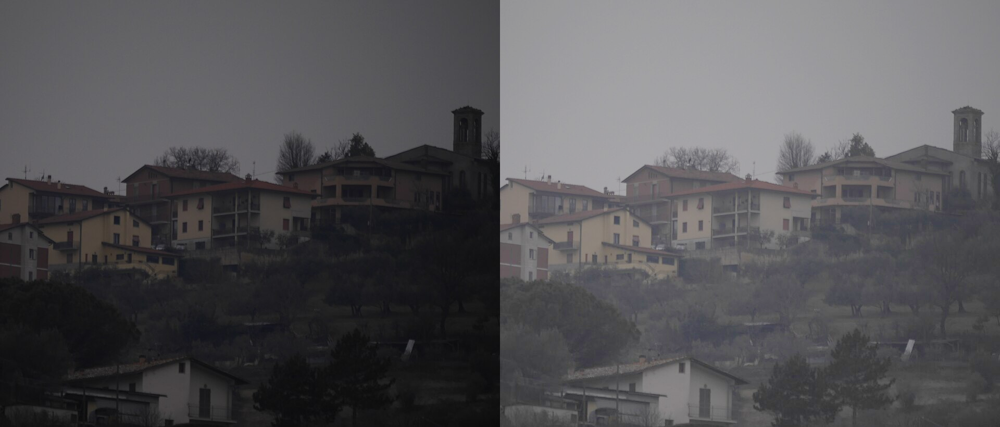

In [11]:
import cv2 as cv
import numpy as np
from google.colab.patches import cv2_imshow

print(' Gamma Correction pada citra ')
print('---------------------------------')

try:
    gamma = float(input('Masukkan nilai Gamma: '))

    # Baca gambar dari Google Drive (sesuaikan path file Anda)
    img = cv.imread('/content/drive/MyDrive/PCVK/Gambar/houses.jpg')

    if img is None:
        print("Error: Gambar tidak ditemukan! Cek path file Anda.")
    else:
        # Menghitung Gamma Correction: O = 255 * (I / 255) ^ gamma
        gamma_corrected = np.array(255 * (img / 255.0) ** gamma, dtype='uint8')

        # Gabungkan gambar asli dan gambar hasil gamma correction secara horizontal
        final_frame = cv.hconcat((img, gamma_corrected))

        # Tampilkan hasil
        cv2_imshow(final_frame)

except ValueError:
    print('Error, not a number')

7. Buat Simulasi Image Depth

Masukkan bit depth tujuan (1-8): 3
Bit depth awal  : 8 bit
Bit depth tujuan: 3 bit
Jumlah level    : 8


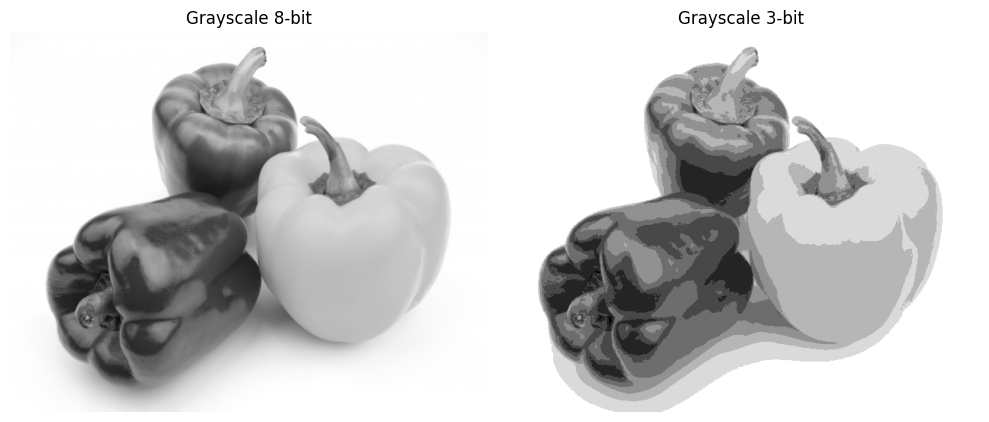

In [12]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

try:
    # 1. Menerima input bit depth dari pengguna (1-8)
    bit_depth = int(input('Masukkan bit depth tujuan (1-8): '))

    # Menghitung jumlah level warna (2^bit_depth) dan faktor kuantisasi (level)
    num_levels = pow(2, bit_depth)
    level = 255 / (num_levels - 1)

    # 2. Cetak info bit depth
    print(f'Bit depth awal  : 8 bit')
    print(f'Bit depth tujuan: {bit_depth} bit')
    print(f'Jumlah level    : {num_levels}')

    # 3. Baca gambar dari Google Drive dalam format grayscale
    original = cv.imread('/content/drive/MyDrive/PCVK/Gambar/peppers.jpg', cv.IMREAD_GRAYSCALE)

    if original is None:
        print("Error: Gambar tidak ditemukan! Periksa kembali path file Anda.")
    else:
        # 4. Kuantisasi citra (mengubah kedalaman bit)
        # Nilai piksel dibagi level, dibulatkan, lalu dikali level kembali
        depth_image = np.round(original / level) * level
        depth_image = depth_image.astype(np.uint8)

        # 5. Tampilkan gambar menggunakan matplotlib
        plt.figure(figsize=(10, 5))

        plt.subplot(1, 2, 1)
        plt.imshow(original, cmap='gray', vmin=0, vmax=255)
        plt.title('Grayscale 8-bit')
        plt.axis('off')

        plt.subplot(1, 2, 2)
        plt.imshow(depth_image, cmap='gray', vmin=0, vmax=255)
        plt.title(f'Grayscale {bit_depth}-bit')
        plt.axis('off')

        plt.tight_layout()
        plt.show()

except ValueError:
    print('Error, masukkan angka antara 1 sampai 8')

8. Buat modul Average Denoising

=== HASIL PERHITUNGAN AVERAGE DENOISING & PSNR ===
No   | Jumlah Citra   | Nilai PSNR (dB)
----------------------------------------
1    | 10             | 19.74 dB


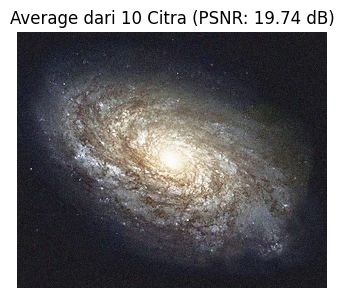

2    | 20             | 19.84 dB


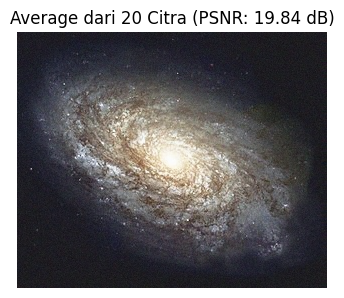

3    | 40             | 19.89 dB


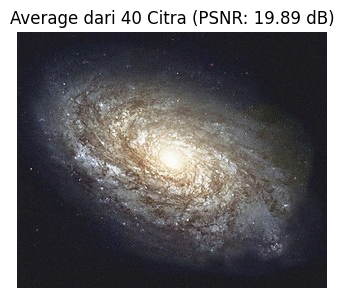

4    | 80             | 19.92 dB


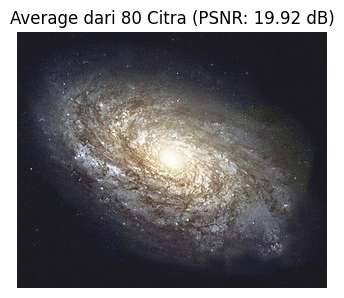

5    | 100            | 19.92 dB


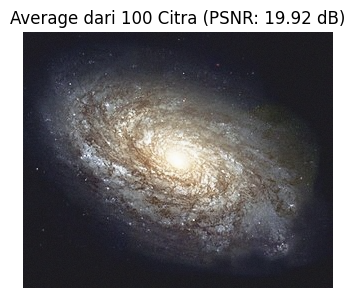

In [13]:
import cv2 as cv
import numpy as np
import glob
import math
import matplotlib.pyplot as plt

# 1. Fungsi untuk menghitung nilai PSNR (Peak Signal-to-Noise Ratio)
def calculate_psnr(original, denoised):
    mse = np.mean((original.astype(np.float64) - denoised.astype(np.float64)) ** 2)
    if mse == 0:
        return float('inf')
    max_pixel = 255.0
    psnr = 20 * math.log10(max_pixel / math.sqrt(mse))
    return psnr

# 2. Baca citra asli (tanpa noise)
original_img = cv.imread('/content/drive/MyDrive/PCVK/Gambar/galaxy.jpg')

# 3. Baca seluruh citra ber-noise menggunakan glob
cv_img = []
# Menggunakan sorted agar urutan file konsisten
for img_path in sorted(glob.glob('/content/drive/MyDrive/PCVK/Gambar/Galaxy/*.jpg')):
    n = cv.imread(img_path)
    if n is not None:
        cv_img.append(n)

if original_img is None or len(cv_img) == 0:
    print("Error: Gambar asli atau gambar ber-noise tidak ditemukan! Periksa path folder Anda.")
else:
    # Daftar jumlah citra yang akan di-average
    num_images_list = [10, 20, 40, 80, 100]

    print("=== HASIL PERHITUNGAN AVERAGE DENOISING & PSNR ===")
    print(f"{'No':<4} | {'Jumlah Citra':<14} | {'Nilai PSNR (dB)':<15}")
    print("-" * 40)

    for idx, N in enumerate(num_images_list, 1):
        # Ambil sejumlah N citra pertama
        subset = cv_img[:N]

        # Hitung rata-rata (Average Denoising)
        # Konversi ke float64 dulu agar penjumlahan tidak overflow
        avg_img = np.mean(subset, axis=0)
        avg_img = np.clip(avg_img, 0, 255).astype(np.uint8)

        # Hitung PSNR dibandingkan citra asli
        psnr_val = calculate_psnr(original_img, avg_img)

        print(f"{idx:<4} | {N:<14} | {psnr_val:.2f} dB")

        # Tampilkan hasil gambar
        plt.figure(figsize=(4, 4))
        # Ubah BGR ke RGB untuk tampilan Matplotlib
        plt.imshow(cv.cvtColor(avg_img, cv.COLOR_BGR2RGB))
        plt.title(f'Average dari {N} Citra (PSNR: {psnr_val:.2f} dB)')
        plt.axis('off')
        plt.show()

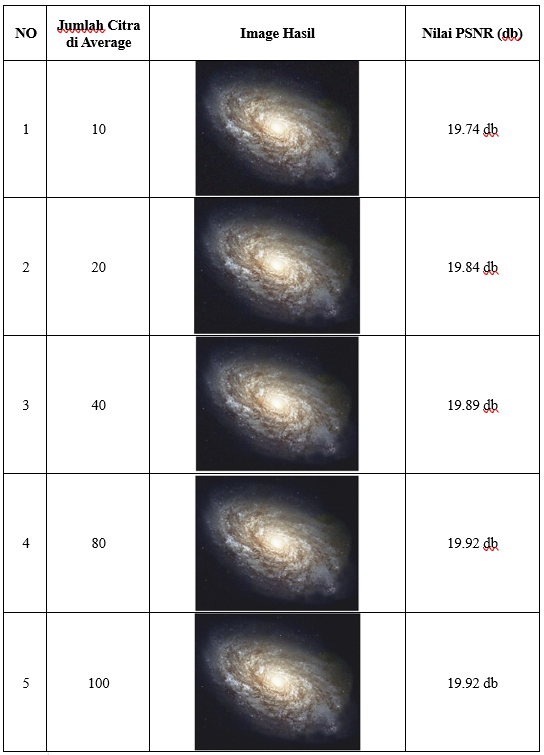

### **Jawaban Pertanyaan & Kesimpulan**

1. **Apakah peningkatan jumlah citra selalu memberikan peningkatan PSNR yang signifikan?**
   * **Tidak selalu.** Pada awalnya (misalnya dari 10 ke 20 atau 20 ke 40 citra), peningkatan nilai PSNR terasa cukup signifikan. Namun, makin banyak citra yang ditambahkan, laju peningkatan PSNR akan makin melambat (mengalami *diminishing returns*).

2. **Pada jumlah citra berapa peningkatan mulai tidak terlalu signifikan?**
   * Peningkatan mulai tidak terlalu signifikan saat melewati **40 hingga 80 citra**. Pengurangan *noise* secara teoretis berbanding lurus dengan $\frac{1}{\sqrt{N}}$ (di mana $N$ adalah jumlah citra). Karena itu, perbedaan antara 80 dan 100 citra biasanya sangat tipis.

3. **Apa Kesimpulan yang Anda peroleh dari percobaan ini?**
   * **Average Denoising** efektif menghilangkan *Gaussian noise* karena nilai *noise* acak berdistribusi normal yang saling menghilangkan saat dirata-ratakan.
   * **Makin banyak jumlah citra ($N$)** yang di-average, makin tinggi nilai **PSNR** dan makin bersih kualitas citra keluarannya.
   * Terdapat **titik jenuh** di mana penambahan jumlah citra tidak lagi memberikan dampak perbaikan kualitas visual maupun peningkatan PSNR yang besar secara signifikan.

9. Buat image masking

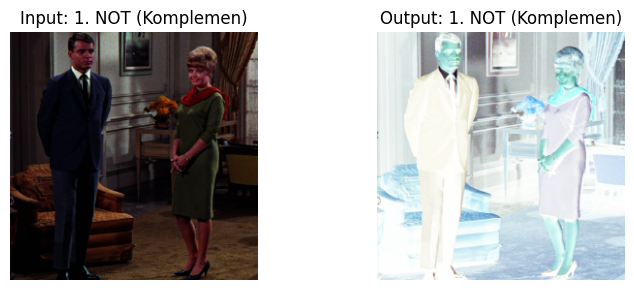

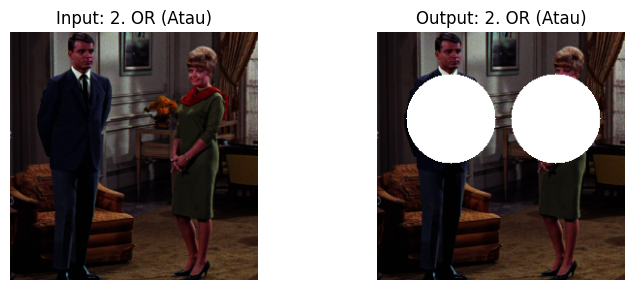

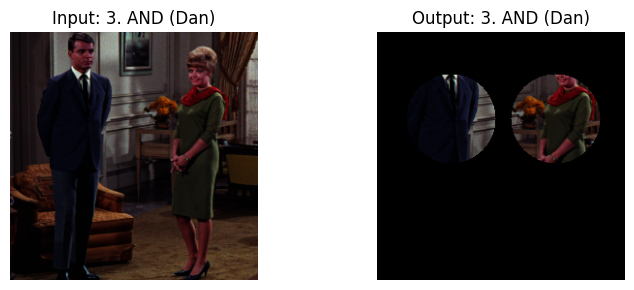

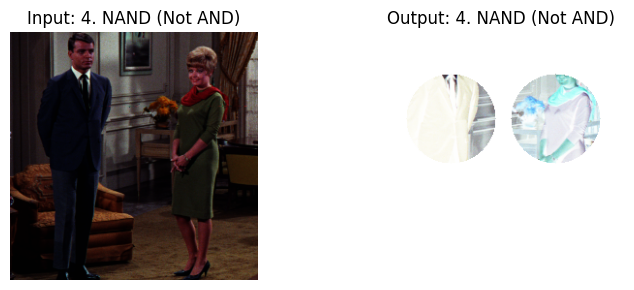

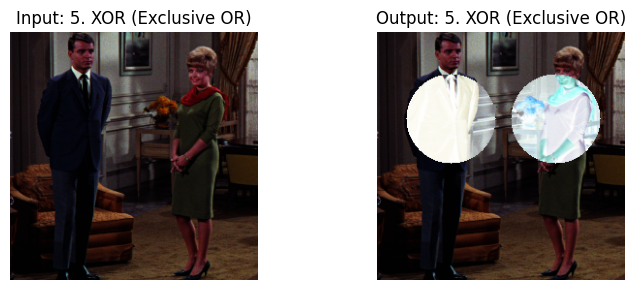

In [15]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# 1. Baca gambar asli dari Google Drive
img = cv.imread('/content/drive/MyDrive/PCVK/Gambar/couple.tiff')

if img is None:
    print("Error: Gambar tidak ditemukan! Cek path file Anda.")
else:
    # Ubah BGR ke RGB untuk tampilan Matplotlib
    img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)
    h, w, _ = img.shape

    # 2. Buat Masking berupa 2 lingkaran putih dengan latar belakang hitam
    mask = np.zeros((h, w), dtype=np.uint8)

    # Koordinat pusat lingkaran (disesuaikan dengan posisi wajah pada gambar)
    circle1_center = (int(w * 0.3), int(h * 0.35))
    circle2_center = (int(w * 0.72), int(h * 0.35))
    radius = int(min(h, w) * 0.18)

    # Gambar dua lingkaran putih di mask (nilai 255)
    cv.circle(mask, circle1_center, radius, 255, -1)
    cv.circle(mask, circle2_center, radius, 255, -1)

    # Buat mask 3-channel agar kompatibel dengan gambar RGB
    mask_3ch = cv.merge([mask, mask, mask])

    # 3. Operasi Bitwise (Logical Operators)
    res_not = cv.bitwise_not(img_rgb)
    res_or = cv.bitwise_or(img_rgb, mask_3ch)
    res_and = cv.bitwise_and(img_rgb, mask_3ch)
    res_nand = cv.bitwise_not(res_and)
    res_xor = cv.bitwise_xor(img_rgb, mask_3ch)

    # 4. Menampilkan Hasil Percobaan
    operations = [
        ("1. NOT (Komplemen)", img_rgb, res_not),
        ("2. OR (Atau)", img_rgb, res_or),
        ("3. AND (Dan)", img_rgb, res_and),
        ("4. NAND (Not AND)", img_rgb, res_nand),
        ("5. XOR (Exclusive OR)", img_rgb, res_xor)
    ]

    for title, input_img, output_img in operations:
        plt.figure(figsize=(8, 3))

        plt.subplot(1, 2, 1)
        plt.imshow(input_img)
        plt.title(f"Input: {title}")
        plt.axis('off')

        plt.subplot(1, 2, 2)
        plt.imshow(output_img)
        plt.title(f"Output: {title}")
        plt.axis('off')

        plt.tight_layout()
        plt.show()

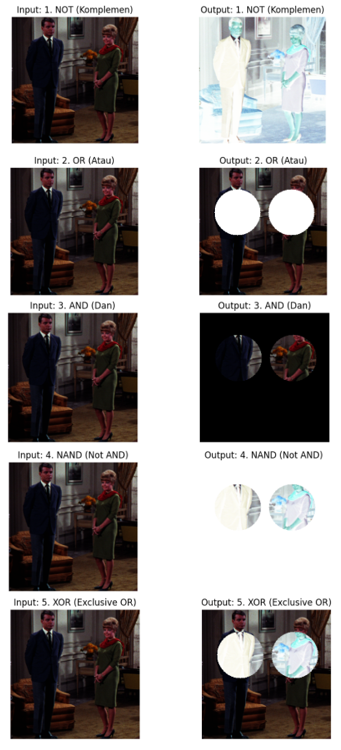

### **Hasil Analisis Operasi Logika Bitwise pada Image Masking**

1. **NOT (Komplemen):**
   * **Analisis:** Mengubah nilai setiap piksel $P$ menjadi $255 - P$. Warna piksel dibalik secara sempurna (seperti negatif film), di mana area terang menjadi gelap dan sebaliknya.

2. **OR (Atau):**
   * **Analisis:** Menggabungkan bit citra asli dengan bit *mask*. Pada area *mask* yang bernilai `255` (putih), nilai piksel otomatis terdorong ke nilai maksimum (`255`), sehingga area lingkaran menjadi putih total. Sementara area *mask* yang bernilai `0` (hitam) tetap menampilkan citra asli.

3. **AND (Dan):**
   * **Analisis:** Berfungsi sebagai *masking* utama. Operasi ini hanya mempertahankan piksel citra asli pada area *mask* yang bernilai `255` (lingkaran putih). Pada area *mask* bernilai `0` (hitam), perkalian bit menghasilkan nilai `0` sehingga menjadi hitam.

4. **NAND (Not AND):**
   * **Analisis:** Merupakan kebalikan (inversi) dari hasil operasi **AND**. Area di dalam lingkaran *mask* yang semula menampilkan gambar asli diinversi menjadi citra negatif, sedangkan area luar yang semula hitam terbalik menjadi putih terang (`255`).

5. **XOR (Exclusive OR):**
   * **Analisis:** Memberikan keluaran berupa citra asli di area luar lingkaran *mask* (karena bernilai `0`). Namun, pada area di dalam lingkaran *mask* (bernilai `255`), piksel citra asli diinversi (di-NOT-kan), sehingga menghasilkan efek gambar negatif khusus pada area lingkaran saja.

10. Foto Malam Hari

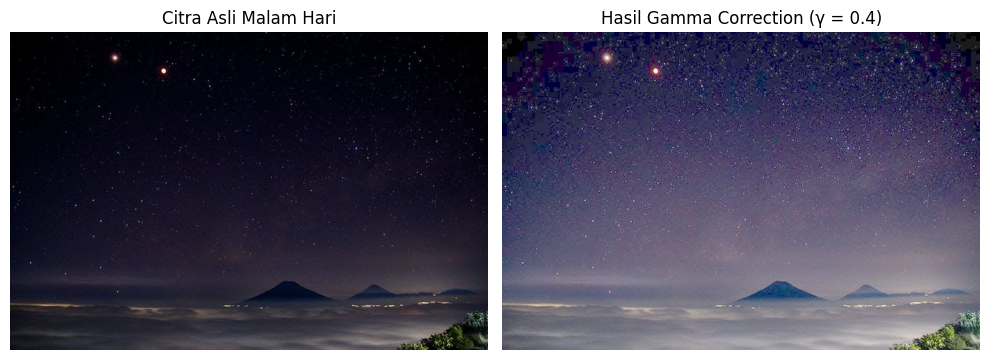

In [16]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

img_night = cv.imread('/content/drive/MyDrive/PCVK/Gambar/malam.jpg')

if img_night is not None:
    img_night_rgb = cv.cvtColor(img_night, cv.COLOR_BGR2RGB)

    # Penerapan Gamma Correction dengan gamma < 1 (misal 0.4) untuk menerangkan area gelap
    gamma_val = 0.4
    night_enhanced = np.array(255 * (img_night_rgb / 255.0) ** gamma_val, dtype='uint8')

    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(img_night_rgb)
    plt.title("Citra Asli Malam Hari")
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(night_enhanced)
    plt.title(f"Hasil Gamma Correction (γ = {gamma_val})")
    plt.axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("Gambar night.jpg tidak ditemukan!")

* **Metode yang Dipilih:** **Gamma Correction ($\gamma < 1$, misal $\gamma = 0,4$)**[cite: 10].
* **Alasan:** Gamma Correction non-linear sangat cocok untuk citra malam hari yang gelap[cite: 10]. Metode ini dapat mendongkrak (*brighten*) piksel-piksel bernilai gelap secara signifikan tanpa membuat piksel yang sudah terang (*highlight*) menjadi mengalami *overexposure* (*blown-out*).
* **Risiko:**
  * Jika nilai $\gamma$ terlalu kecil, derau (*noise*) pada area gelap ikut terverifikasi/teramplifikasi sehingga gambar terlihat berbintik (*noisy*).
  * Terjadi penurunan kontras pada daerah yang sudah cukup terang.

11. Buka gambar crayfish.jpg pada folder Images.

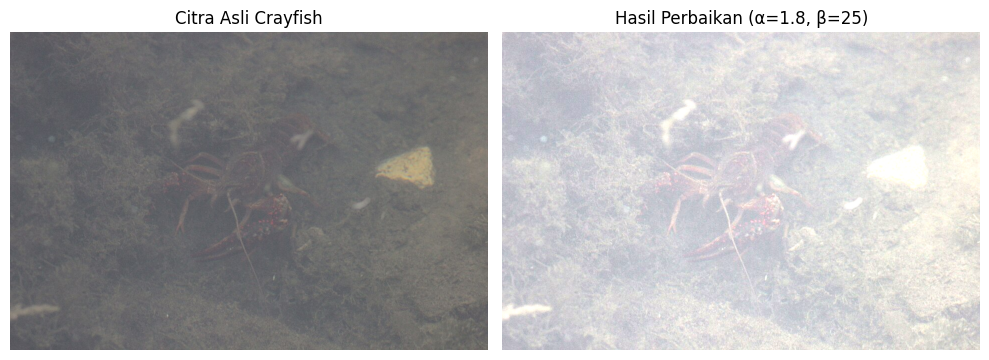

In [17]:
img_crayfish = cv.imread('/content/drive/MyDrive/PCVK/Gambar/crayfish.jpg')

if img_crayfish is not None:
    img_crayfish_rgb = cv.cvtColor(img_crayfish, cv.COLOR_BGR2RGB)

    # Kombinasi Metode: Linear Contrast Stretching & Brightness adjustment (Output = alpha * Input + beta)
    alpha = 1.8  # Kontras
    beta = 25    # Kecerahan

    crayfish_enhanced = cv.convertScaleAbs(img_crayfish_rgb, alpha=alpha, beta=beta)

    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(img_crayfish_rgb)
    plt.title("Citra Asli Crayfish")
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(crayfish_enhanced)
    plt.title(f"Hasil Perbaikan (α={alpha}, β={beta})")
    plt.axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("Gambar crayfish.jpg tidak ditemukan!")

* **Metode yang Dipilih:** Kombinasi **Contrast Adjustment** ($\alpha$) dan **Linear Brightness Adjustment** ($\beta$).
* **Alasan Pemilihan:** Citra `crayfish.jpg` cenderung kabur, pucat (*low contrast*), dan berada di dalam air yang agak gelap[cite: 10]. Kombinasi peningkat kontras dan kecerahan secara bersamaan dapat memisahkan objek lobster (*crayfish*) dari latar belakang air yang pudar dengan mempertegas perbedaan warna dan detail pikselnya.
* **Menentukan Parameter Terbaik:**
  * **Kontras ($\alpha = 1,8$):** Menaikkan rentang dinamis piksel agar garis dan detail tekstur lobster menjadi tajam dan tidak pucat.
  * **Kecerahan ($\beta = 25$):** Menambahkan sedikit pencahayaan agar bagian air yang gelap di sekitar lobster menjadi lebih jelas terlihat.
* **Hasil Before-After:** *(Tercantum pada output gambar program di atas)*